In [1]:
# import required python plugins and load the data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
loan_df = pd.read_excel('loan.xlsx')

In [2]:
loan_df.shape

(39717, 111)

In [48]:
### DELETING UNNECESSARY COLUMNS

In [49]:
# get all columns as a list and go through all columns and check for mean percentages of null values in those columns
# if mean percentage of null values is greater than 30 then add to to_drop list
columns = loan_df.columns.to_list()
to_drop = ['id', 'member_id', 'emp_title', 'title', 'url', 'zip_code', 'funded_amnt', 'funded_amnt_inv', 'earliest_cr_line', 'inq_last_6mths', 
           'open_acc', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
           'collection_recovery_fee', 'revol_bal', 'total_pymnt_inv', 'last_pymnt_d', 'last_pymnt_amnt', 'sub_grade'
          ]
for x in columns:
    mean_x = loan_df[x].isnull().mean()*100
    if mean_x > 30.0: # all the columns where mean percentage of null values is greater than 30
        to_drop.append(x)
    if loan_df[x].nunique() == 1: #all the columns with single unique values
        to_drop.append(x)

In [50]:
## remove all the columns in to_drop list
for x in to_drop:
    loan_df = loan_df.drop(x, axis=1)

print(loan_df.columns.to_list())

['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'addr_state', 'dti', 'delinq_2yrs', 'pub_rec', 'revol_util', 'total_pymnt', 'last_credit_pull_d', 'pub_rec_bankruptcies']


In [51]:
# classify numerical and categorical columns based on number of unique values
columns = loan_df.columns.to_list()
categorical = []
numerical = []
for x in columns:
    if 2 <= loan_df[x].nunique() <= 30:
        categorical.append(x)
    else:
        numerical.append(x)

In [54]:
# cleaning the date fields, numerical fields and categorical fields
date_fields = ['issue_d', 'last_credit_pull_d']
non_numeric_fields = ['sub_grade', 'addr_state']
numeric_fields = list(set(numerical)-set(date_fields)-set(non_numeric_fields))
for x in date_fields:
    loan_df[x] = pd.to_datetime(loan_df[x])
for x in numeric_fields:
    loan_df[x] = pd.to_numeric(loan_df[x])
loan_df['term'] = loan_df['term'].apply(lambda x: int(x.replace(' months', '')))
print(categorical)

AttributeError: 'int' object has no attribute 'replace'

In [55]:
## find the columns with mean percentage of null values not 0
loan_df.isnull().mean()*100

loan_amnt               0.000000
term                    0.000000
int_rate                0.000000
installment             0.000000
grade                   0.000000
emp_length              2.706650
home_ownership          0.000000
annual_inc              0.000000
verification_status     0.000000
issue_d                 0.000000
loan_status             0.000000
purpose                 0.000000
addr_state              0.000000
dti                     0.000000
delinq_2yrs             0.000000
pub_rec                 0.000000
revol_util              0.125891
total_pymnt             0.000000
last_credit_pull_d      0.005036
pub_rec_bankruptcies    1.754916
dtype: float64

In [56]:
## IMPUTING THE ROWS FOR NUMERICAL COLUMNS
# 1. emp_length
## filling null values with the mode for emp_length column
emp_length_mode = loan_df['emp_length'].mode()[0]
loan_df['emp_length'] = loan_df['emp_length'].fillna(emp_length_mode)

# 2. revol_util
## filling null values with the median for revol_util column
loan_df['revol_util'] = loan_df['revol_util'].apply(lambda x: float(str(x).replace('%', "")) if x else x)
revol_util_median = loan_df['revol_util'].median()
loan_df['revol_util'] = loan_df['revol_util'].fillna(revol_util_median)

# 3. pub_rec_bankruptcies
## delete the rows where pub_rec_bankruptcies is null. Because the percentage of null values here is < 1 and this field cant be imputed with some values.
loan_df = loan_df[loan_df['pub_rec_bankruptcies'].notnull()]
loan_df.isnull().mean()*100

# 4. last_credit_pull_d
## delete the rows where last_credit_pull_d is null. Because the percentage of null values here is < 1 and this field cant be imputed with some values.
loan_df = loan_df[loan_df['last_credit_pull_d'].notnull()]


In [57]:
##### IMPUTE ROWS OF CATEGORICAL COLUMNS
### 1. purpose
## remove rows with purpose as other as we dont know what is other
loan_df = loan_df[loan_df['purpose'] != 'other']

### 2. home_ownership
## remove rows with home_ownership as other as we dont know what is other
loan_df = loan_df[loan_df['home_ownership'] != 'OTHER']

In [58]:
loan_df.shape
### analyze only the data for which loan_status is not Current
loan_df = loan_df[loan_df['loan_status'].apply(lambda x: x in ['Fully Paid', 'Charged Off'])]
loan_df.shape

(34034, 20)

In [43]:
### UNIVARIATE ANALYSIS

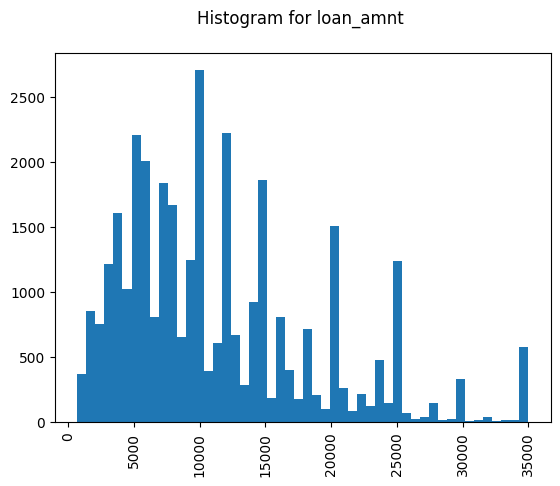

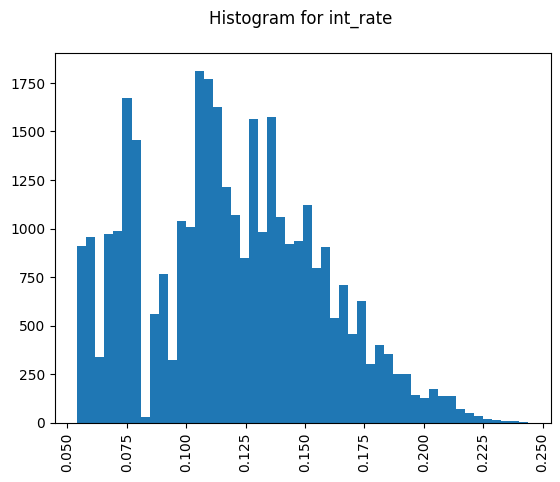

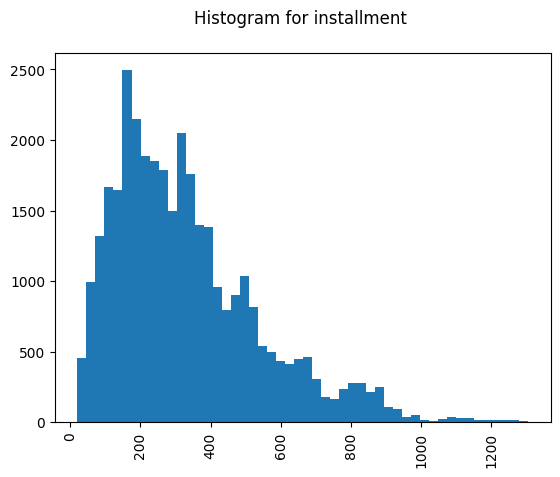

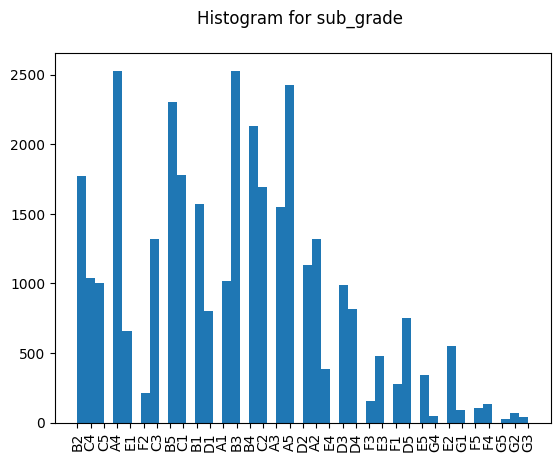

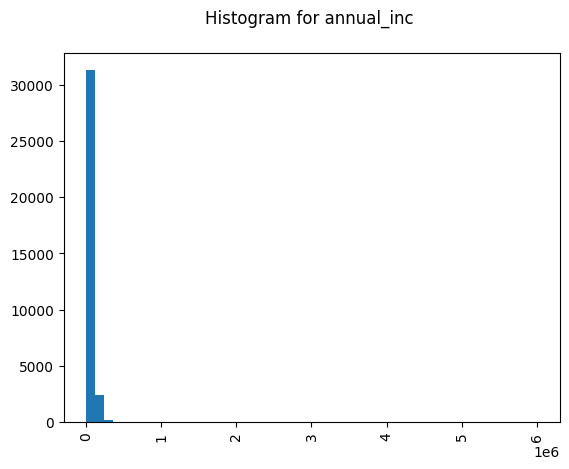

...

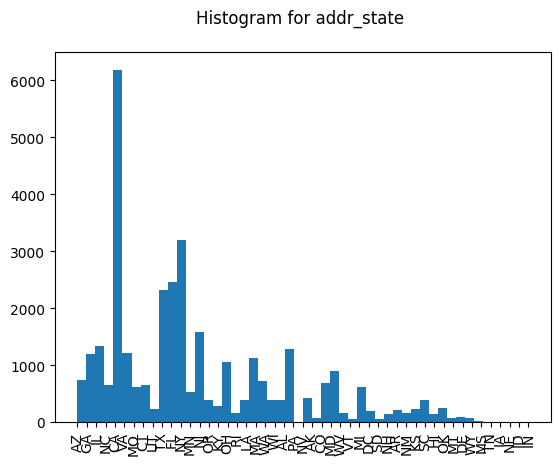

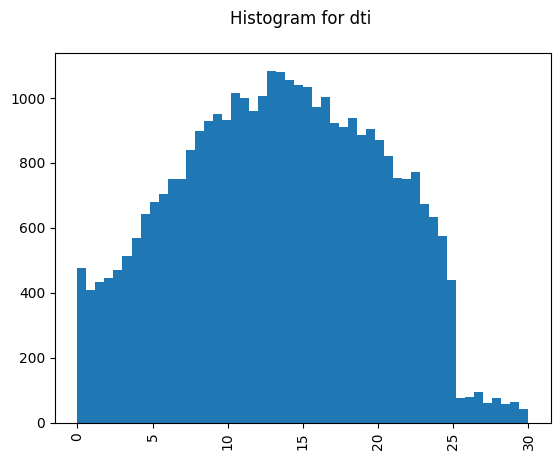

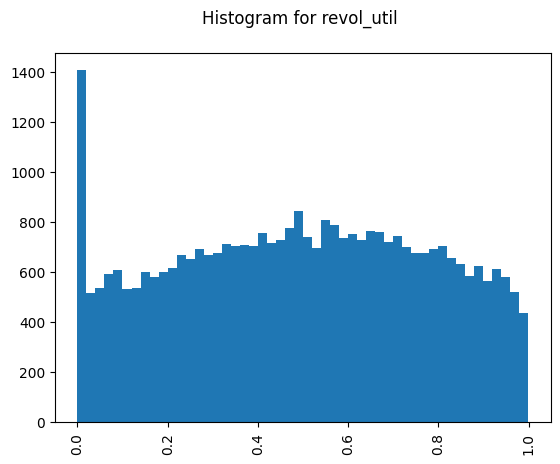

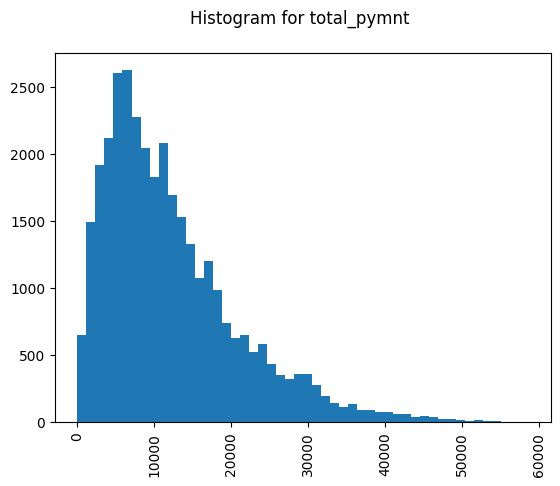

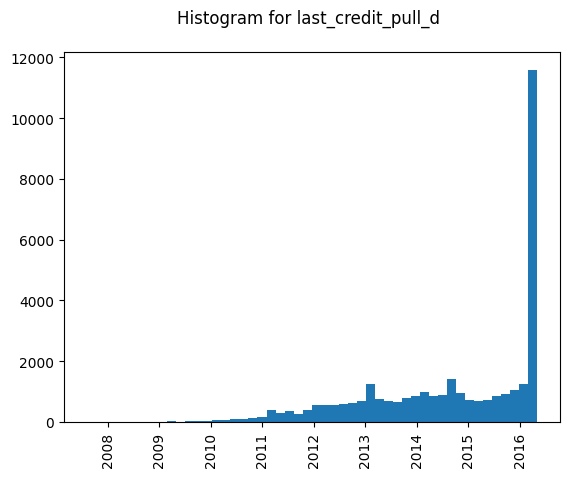

In [44]:
## NUMERICAL
for x in numerical:
    plt.hist(loan_df[x], bins=50)
    plt.xticks(rotation=90)
    plt.title('Histogram for '+x+' \n')
    plt.show()

### CLEAR INDICATIONS
### Annual Increment - annual_inc : Majority of people who have taken loan had an annual increment between 0 to 1 lakh
### Issue Date - issue_d : Majority of people who have taken loan took it between July 2011 to Dec 2011. Least fall between Jul 2007 to Jan 2008
### State - addr_state :  Majority of people who have taken loan fall in the state of CA
### Debt payments to Debt obligations ratio: dti : Majority of people who have taken loan have dti between 5 and 25
### Credit revolving balance : revol_bal :  Majority of people who have taken loan have open credit lines in credit file balance between 0 and 1000. The less the revol_bal the lesser the number of people and viceversa
### Credit revolving line utilization rate : revol_util :  Majority of people who have taken loan have revol_util between 0.0 and 0.01
### Outstanding principal for total amount funded : out_prncp : Majority of people who have taken loan have out_prncp between 0.0 and 100.0
### Payments received to date: total_pymnt : Majority of people who have taken loan have paid amount between 0 and 10000

### UNCLEAR INDICATIONS
### Loan amount - loan_amnt : Majority of people have taken loan between 5000 to 10000
### Interest Rate - int_rate : Majority of people have taken interest rate between 10% and 14%
### Installment - installment : Majority of people who have taken loan took installments between 100 to 400 months
### Open credit lines : open_acc: Majority of people who have taken loan have open credit lines in credit file balance below 10
### Credit pull date: last_credit_pull_d : Majority of people who have taken loan have last credit pull date in the year 2016

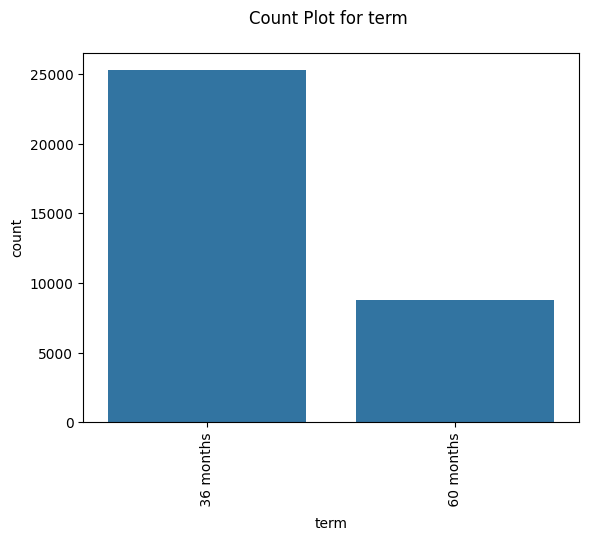

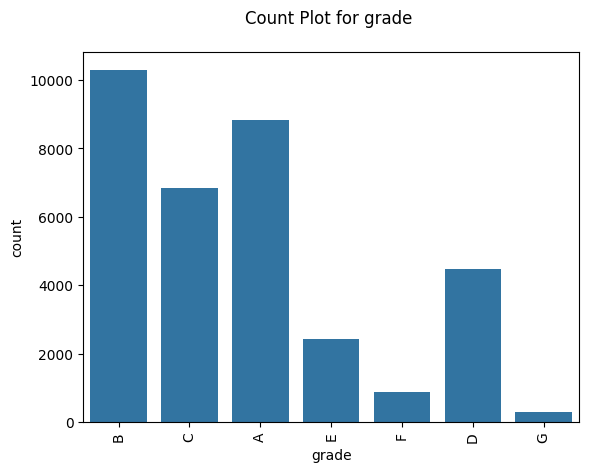

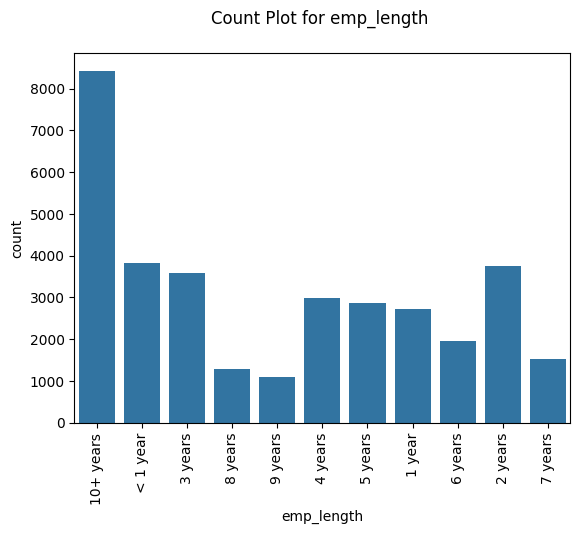

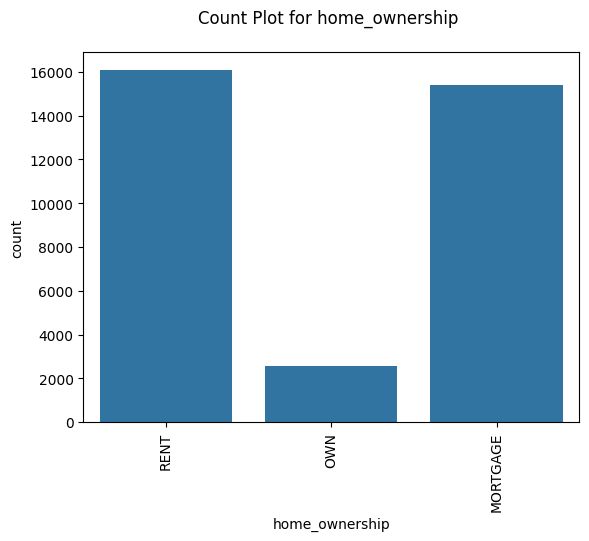

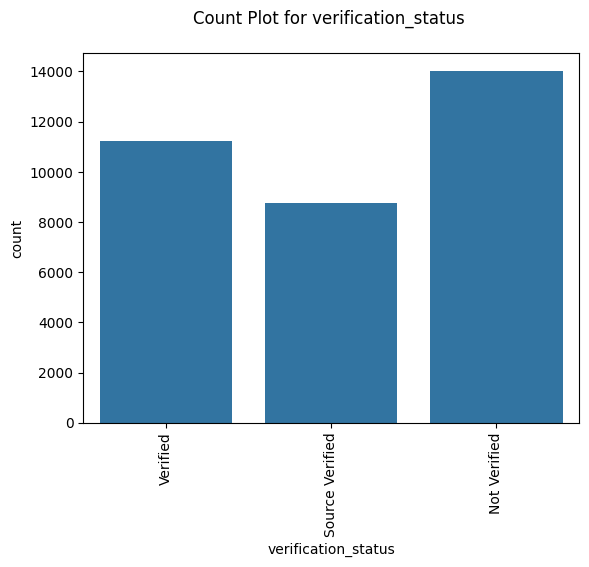

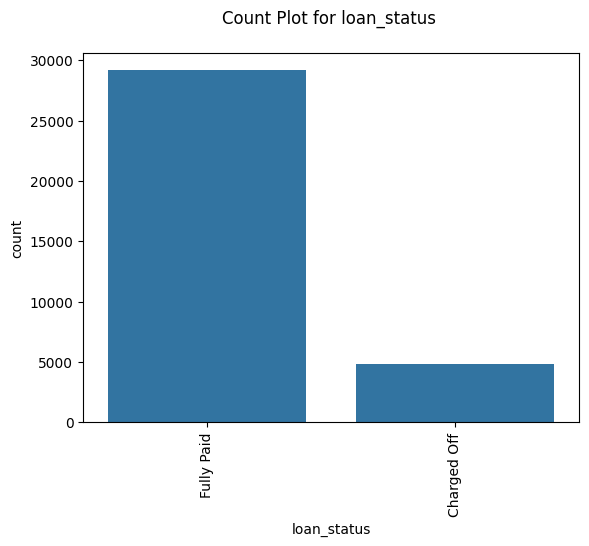

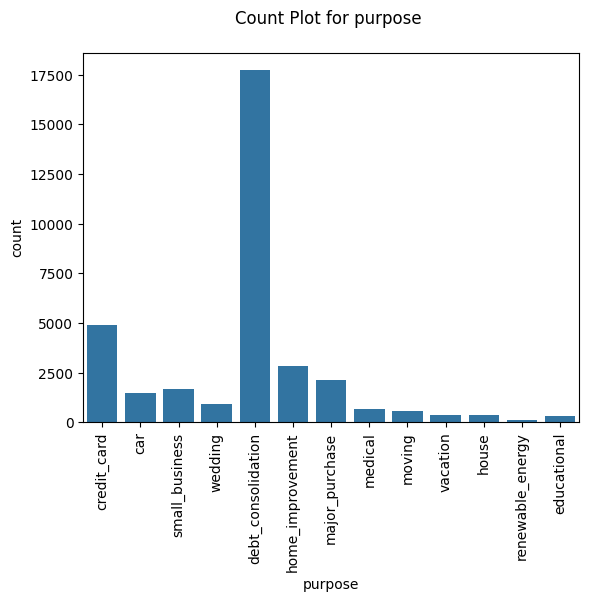

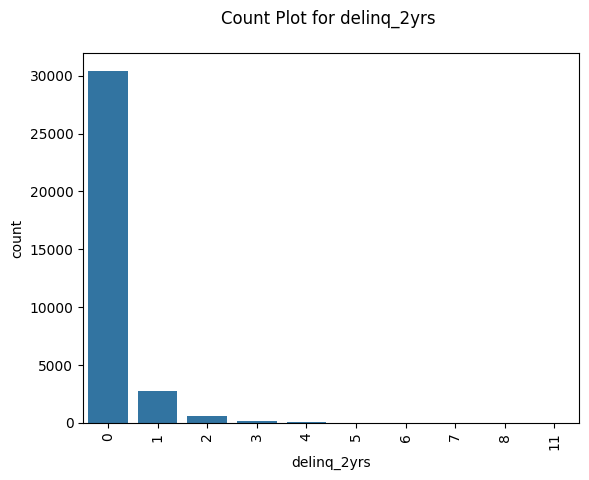

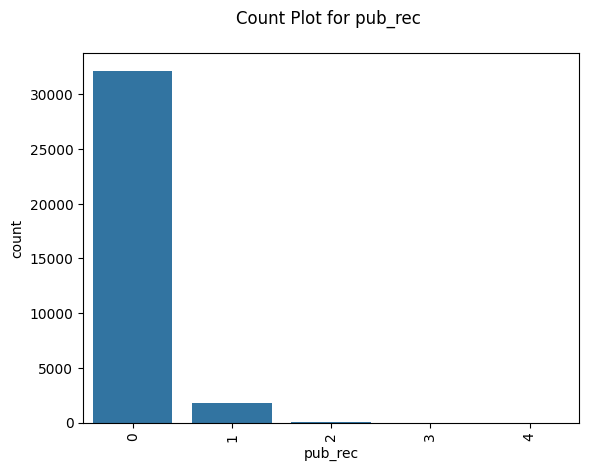

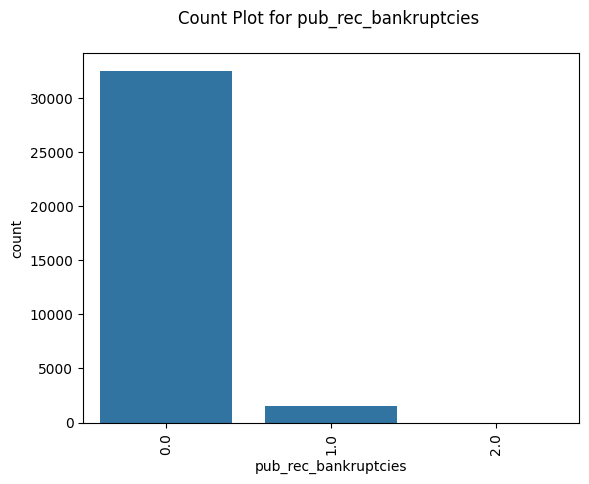

In [45]:
## CATEGORICAL
for x in categorical:
    sns.countplot(x = x, data = loan_df)
    plt.title('Count Plot for '+x+' \n')
    plt.xticks(rotation=90)
    plt.show()

### CLEAR INDICATION
    
### term: Majority of people who have taken loan took it for a term of 36 months
### employee_length :  Majority of people who have taken loan fall with employment duration of 10+years.
### home_ownership : Least number of people who have taken loan are home owners
### loan_status : Majority of people who took loan have fully paid. least number of them are currently paying.
### purpose : Majority of people who took loan have purpose as debt_consolidation
### Number of Past due incidents in past 2 years: delinq_2_years : Majority of people who took loan have delinq_2_years as 0. least number of people have it as 4

### UNCLEAR INDICATIONS
### grade: Majority of people who have taken loan fall in grades B and A. Least fall in grade G
### verification_status : Income source is not verified for majority of people who took loan


In [46]:
#### BIVARIATE ANALYSIS

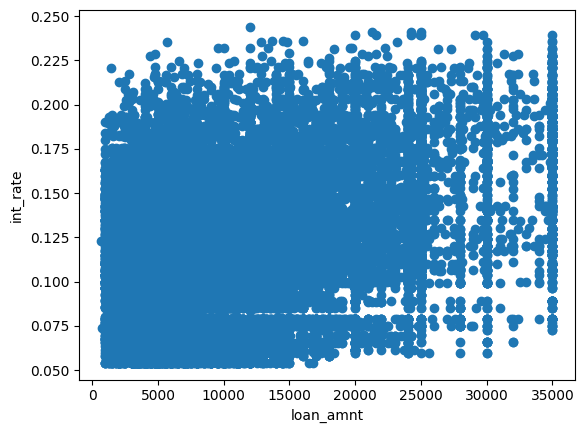

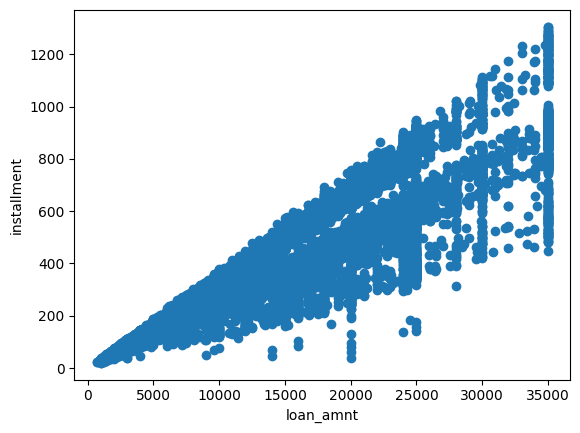

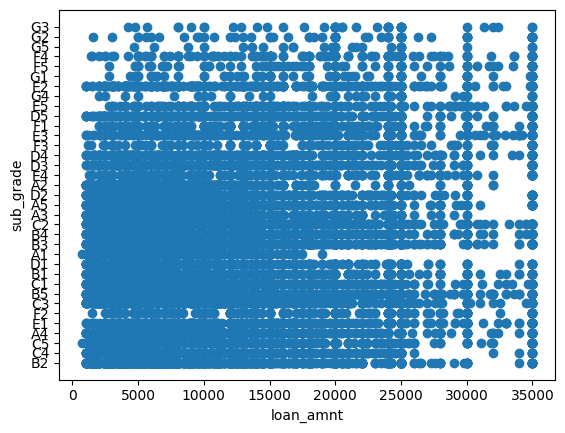

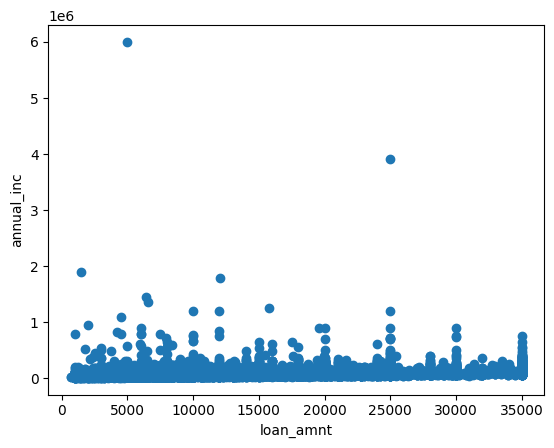

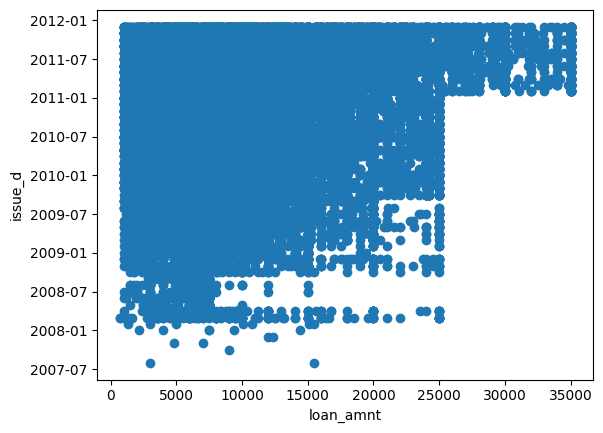

...

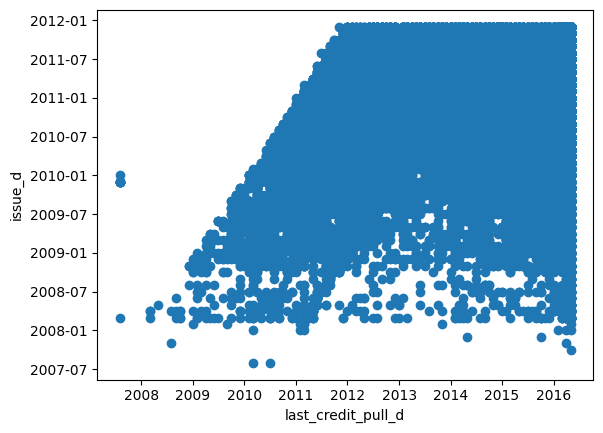

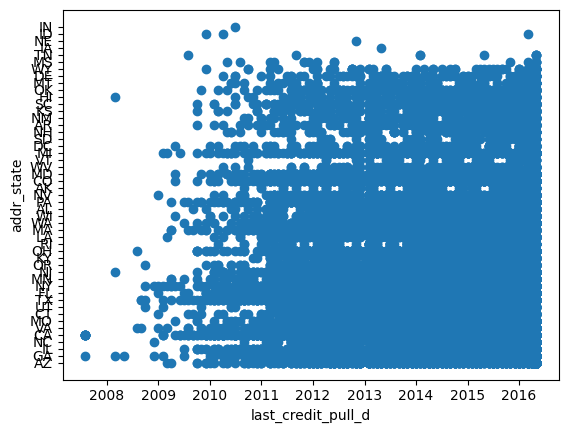

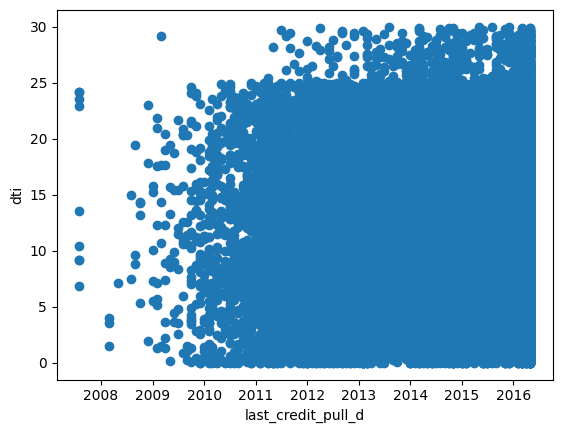

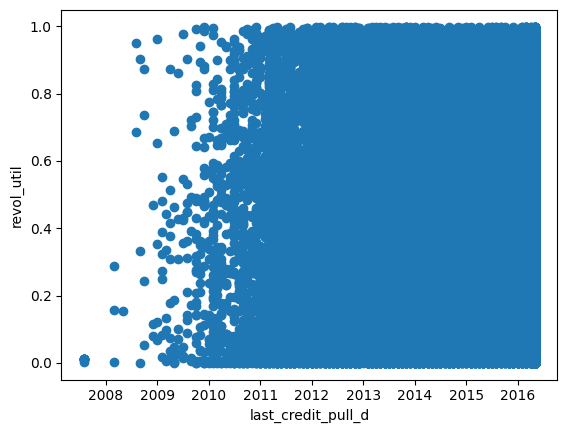

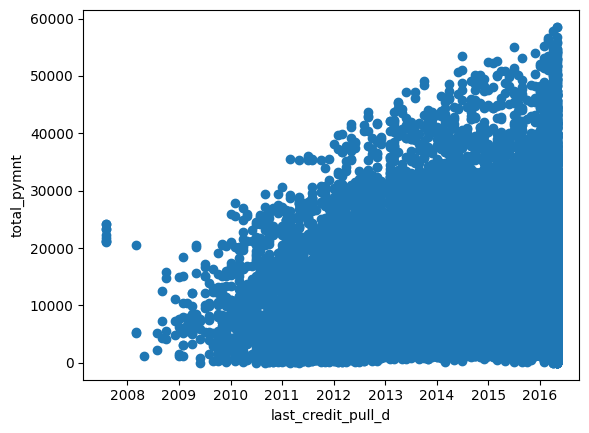

In [47]:
for x in numerical:
    for y in numerical:
        if x!= y:
            plt.scatter(loan_df[x], loan_df[y])
            plt.xlabel(x)
            plt.ylabel(y)
            plt.show()

#### funded_amnt vs loan_amnt : Linearly proportional, in most of the cases if one increases the other is sampe or increases
#### installment vs loan_amnt: Linearly proportional, in most of the cases if one increases the other is same or increases
### total_pymnt vs loan_amnt :  Linearly proportional, in most of the cases if one increases the other is same or increases
### last_pymnt_amnt vs loan_amnt :  Linearly proportional, in most of the cases if one increases the other is same or increases

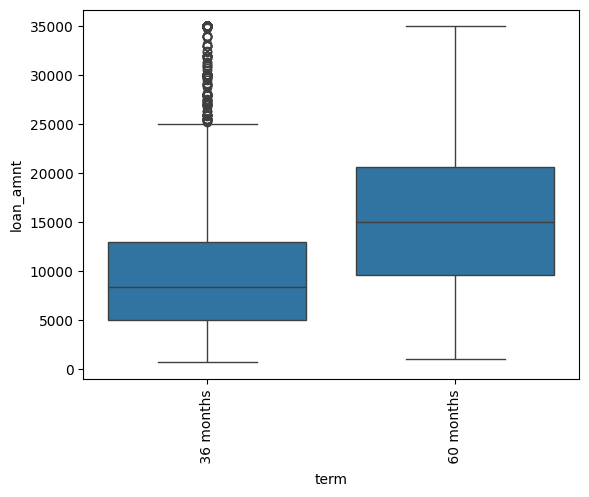

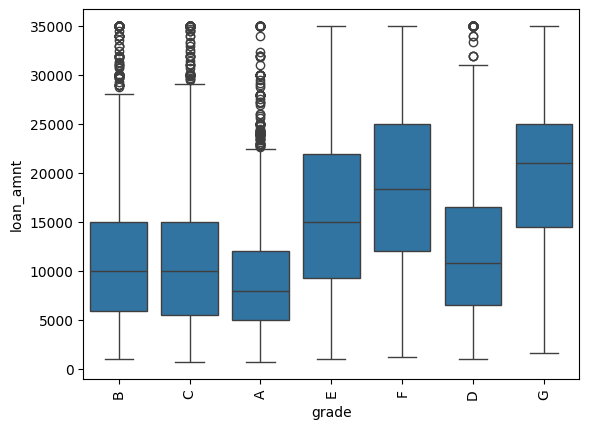

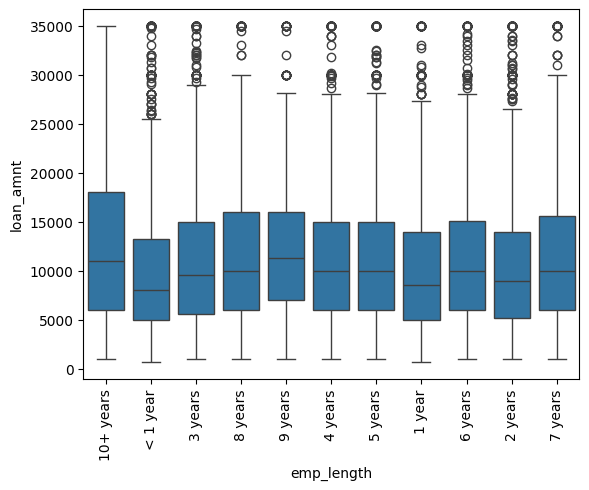

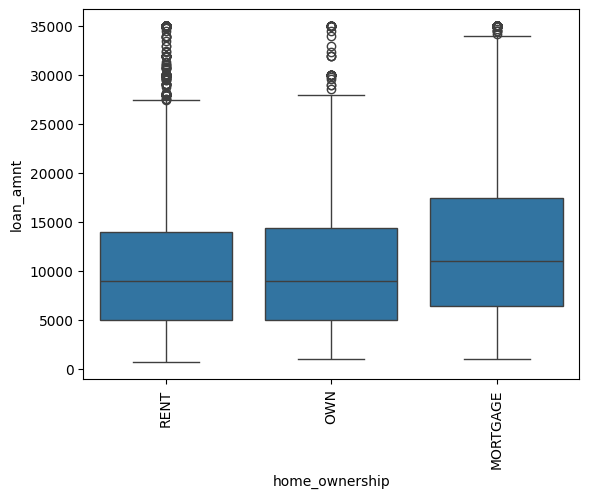

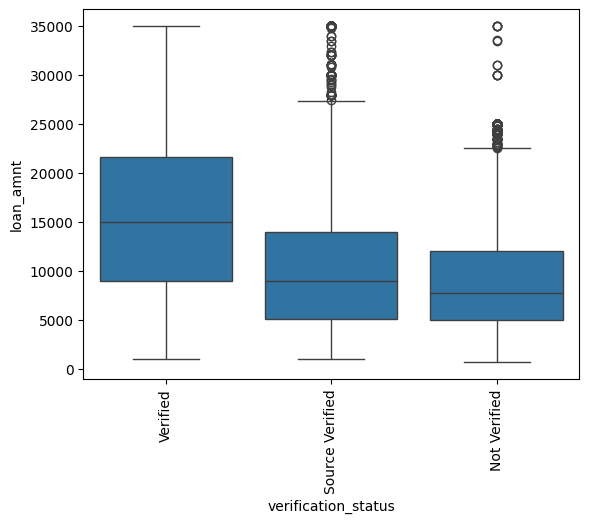

...

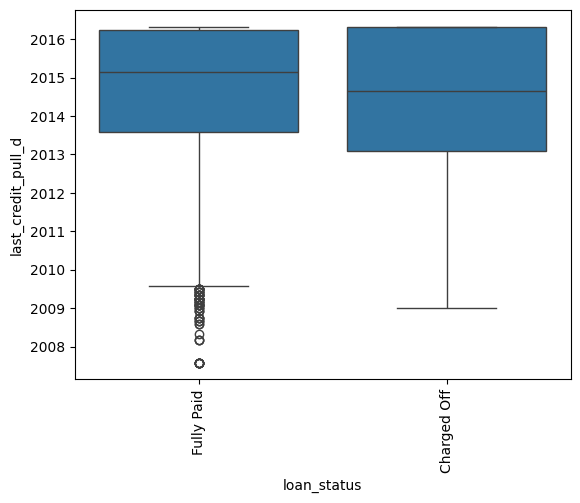

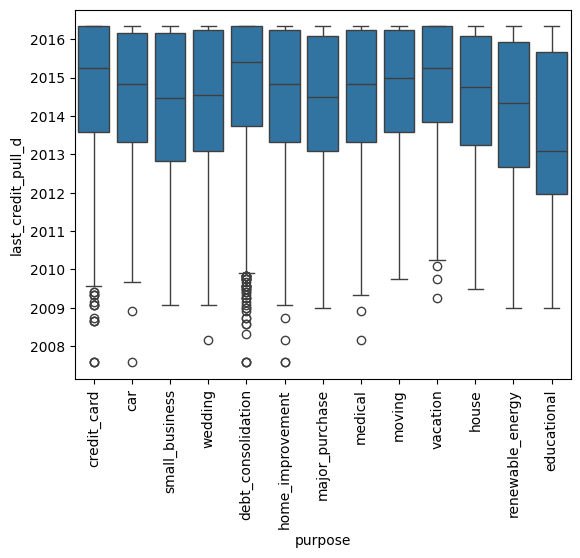

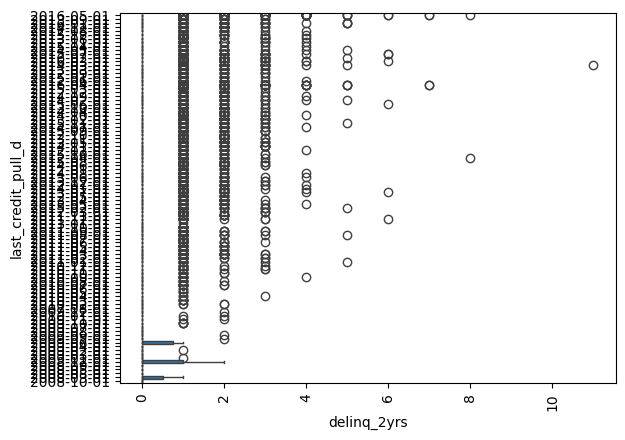

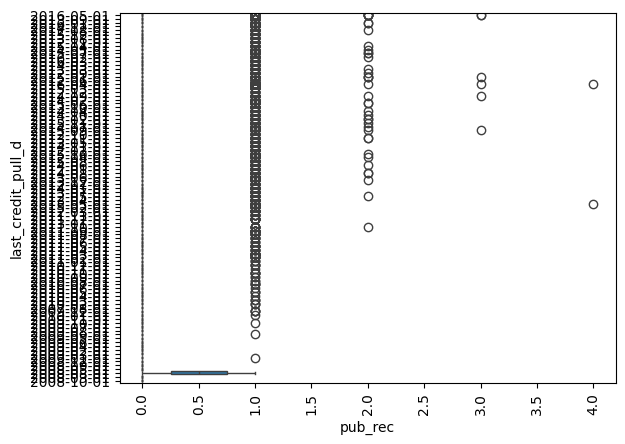

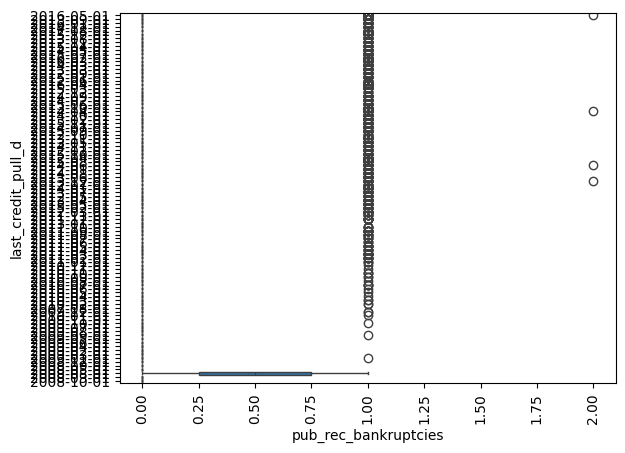

In [48]:
for p in numerical:
    for q in categorical:
        if p!= q:
            sns.boxplot(x=loan_df[q], y=loan_df[p])
            plt.xticks(rotation=90)
            plt.xlabel(q)
            plt.ylabel(p)
            plt.show()

### loan_amnt vs term : people with 60 month term have taken more loan amount than 36 months term
### loan_amnt vs grade : people in grade G have taken minimum loan greater than any other grade
### loan_amnt vs employment_length : people with employment length 10+ years have taken highest loan amount 
### loan_amnt vs home_ownership : people in mortgage have taken higher loan amount
### loan_amnt vs verification_status : people with verified status have taken higher loan amount with min loan amount also higher than other min loan amounts
### loan_amnt vs loan_status : people who are paying currently have taken higher loan amount with min loan amount greate then 50th percentile of other loan statuses
### loan_amnt vs purpose : people who wanted to do small business have taken higher loan amount next comes house purchase

### int_rate vs term: people in 60 months term are paying higher interest rate
### int_rate vs grade : people in grade A have taken least interest rate. people in grade G are paying highest interest rate
### int_rate vs verification_status: people who are verified are paying less interest rate
### int_rate vs loan_status: people who have fully paid have paid least interest rates with max values also less than the other statuses
### int_rate vs purpose: people from small_business are paying higher max interest rates and min interest rates
### int_rate vs pub_rec: people with pub_rec as 0 have paid less interest rates

### installment vs verification_status: people who are verified are paying more installments
### installment vs purpose: people who took house or small business are paying more installments

### issue_d vs purpose: educational loan is issued only between 2009 and 2010

### revol_util vs loan_status: people with status as charged off have slightly higher revol_util

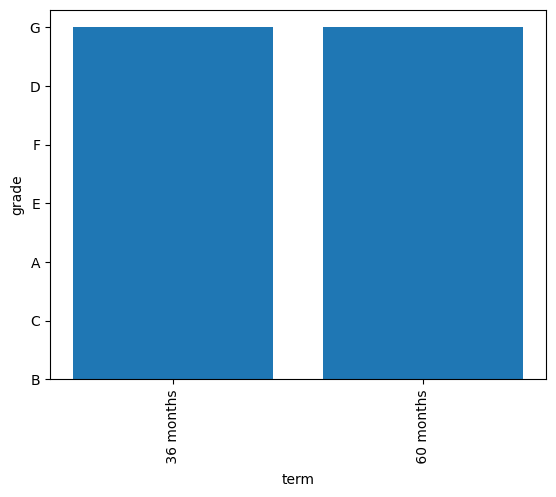

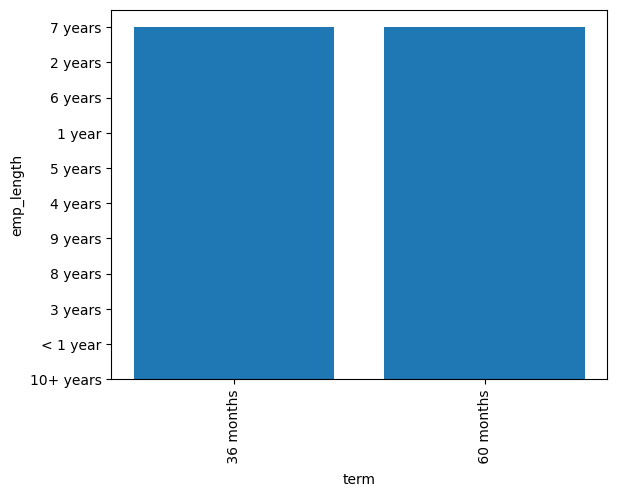

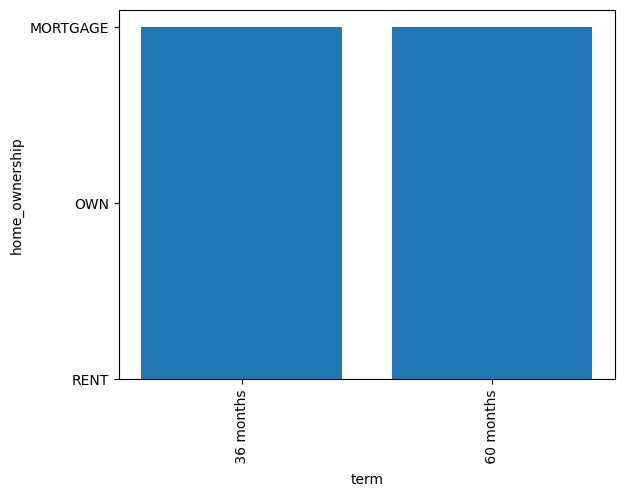

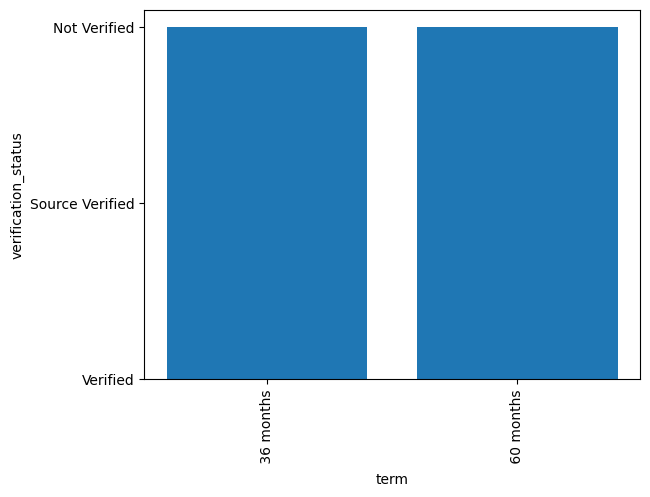

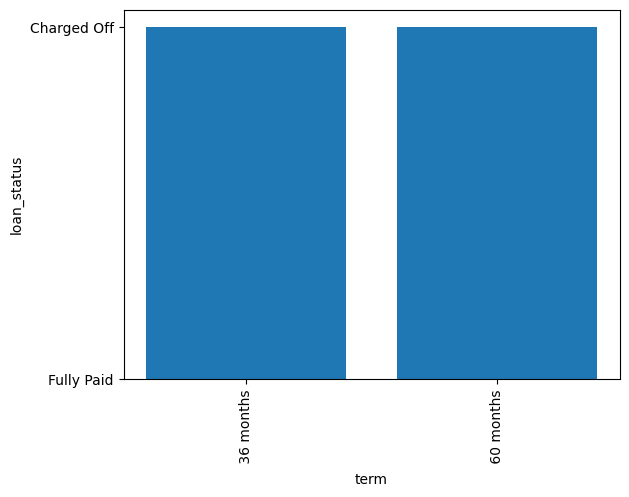

...

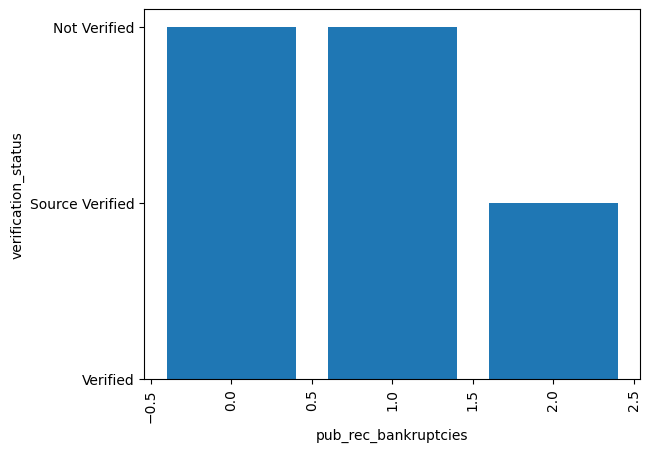

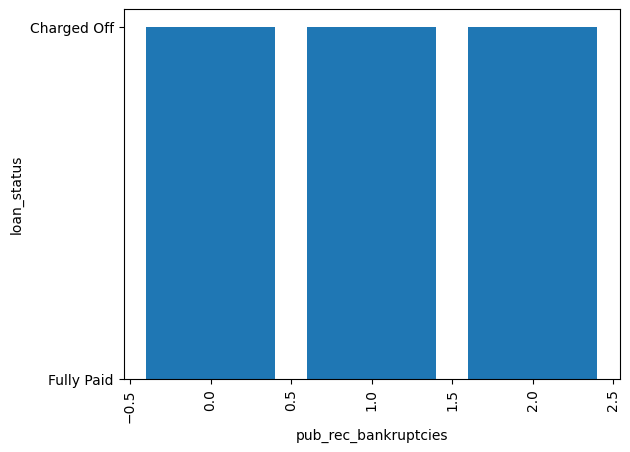

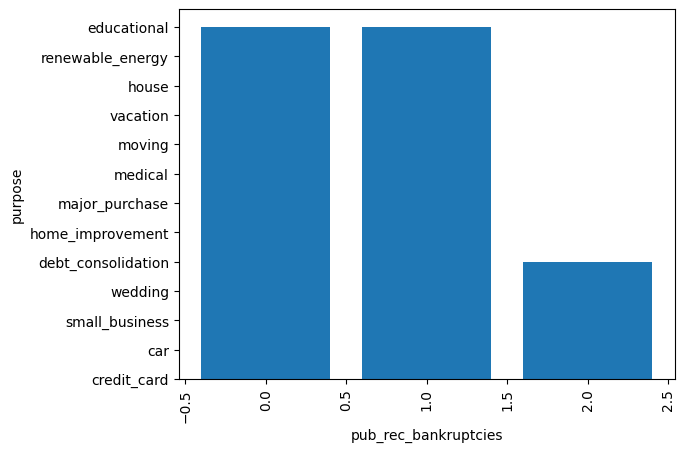

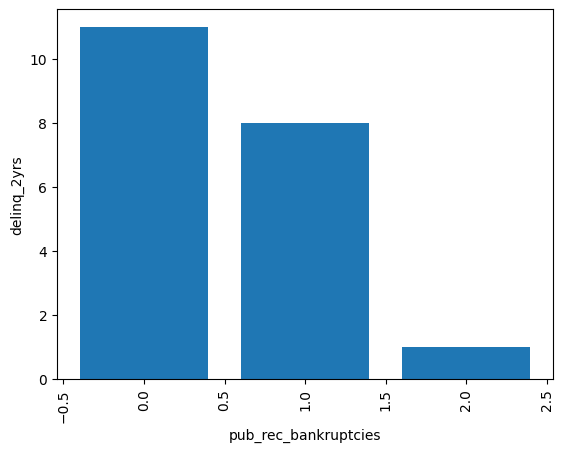

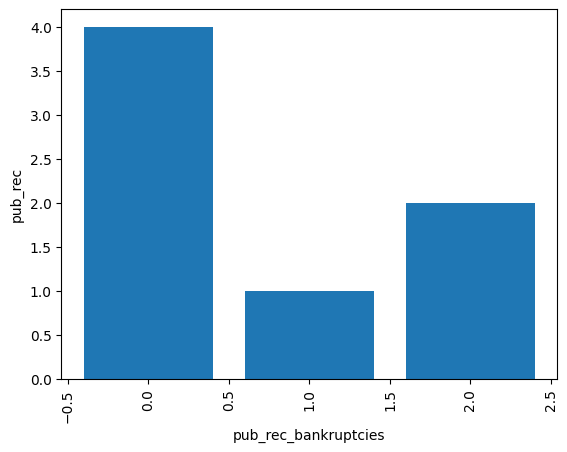

In [49]:
for p in categorical:
    for q in categorical:
        if p!= q:
            plt.bar(loan_df[p], loan_df[q])
            plt.xticks(rotation=90)
            plt.xlabel(p)
            plt.ylabel(q)
            plt.show()

### grade vs delinq_2yrs: people in grade B have highest delinq_2yrs
### employee_length vs delinq_2yrs: people with employee_length as 5 years have highest delinq_2yrs
### home_ownership vs delinq_2yrs: Renters have higher delinq_2yrs
### home_ownership vs pub_rec: Mortgage people have high pub_rec
### home_ownership vs pub_rec_bankruptcies: owners have the least pub_rec_bankruptcies

<Axes: >

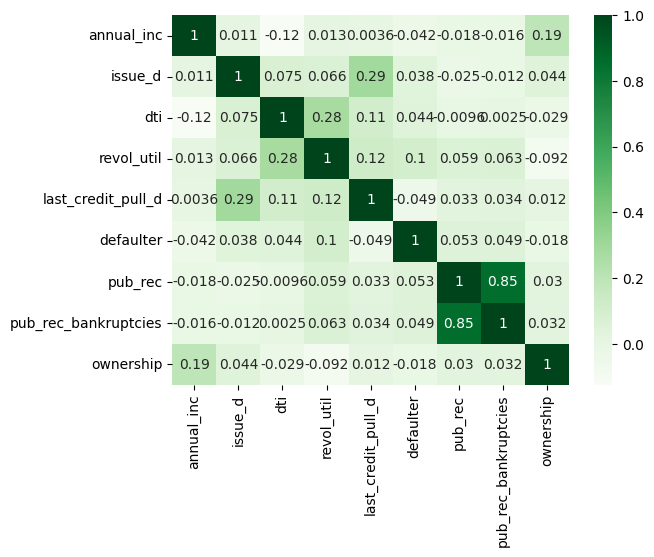

In [88]:
### Multivariate analysis
loan_df['defaulter'] = loan_df['loan_status'].apply(lambda x: 1 if x=='Charged Off' else 0)
loan_df['ownership'] = loan_df['home_ownership'].apply(lambda x: 1 if x=='RENT' else (2 if x=='OWN' else 3))
nums = ['annual_inc', 'issue_d', 'dti', 'revol_util', 'last_credit_pull_d', 'defaulter', 'pub_rec', 'pub_rec_bankruptcies', 'ownership']
new_df = loan_df[nums]
sns.heatmap(new_df.corr(), cmap='Greens', annot=True)

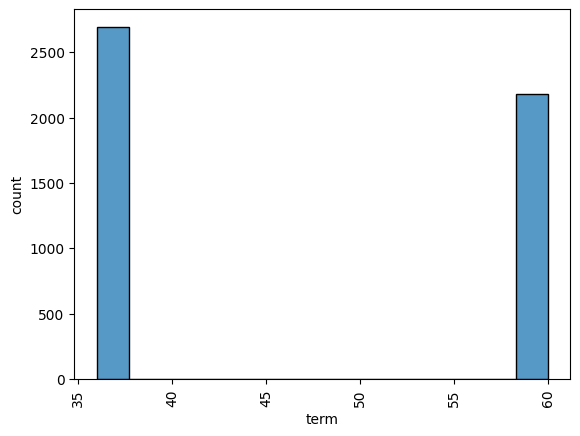

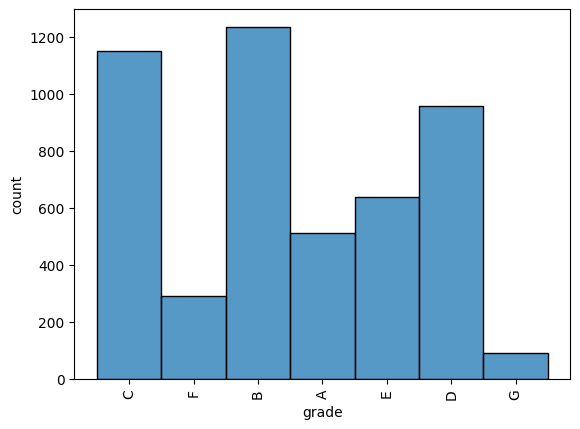

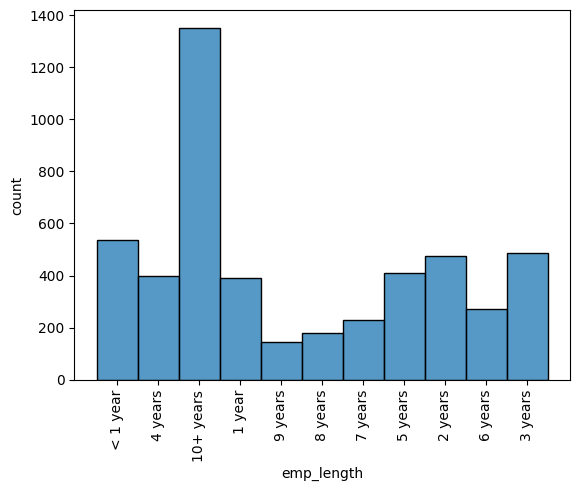

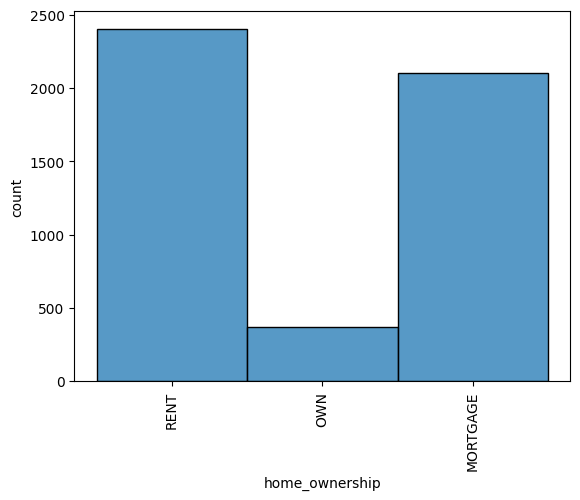

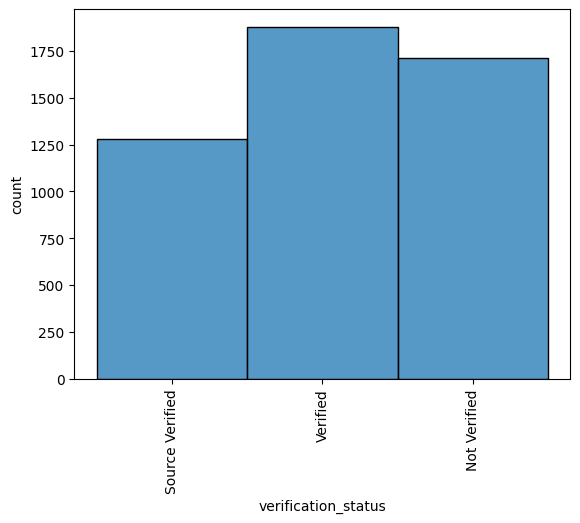

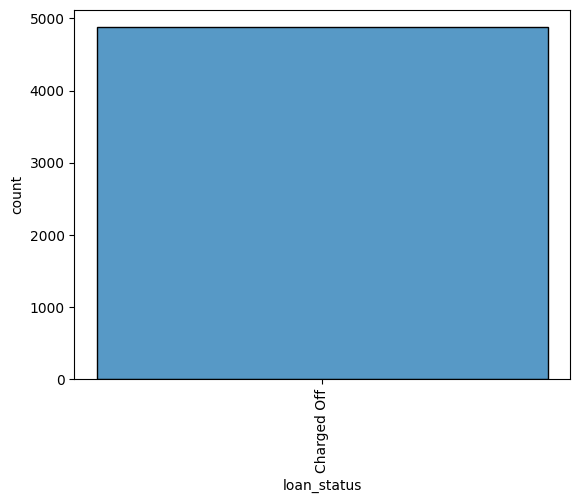

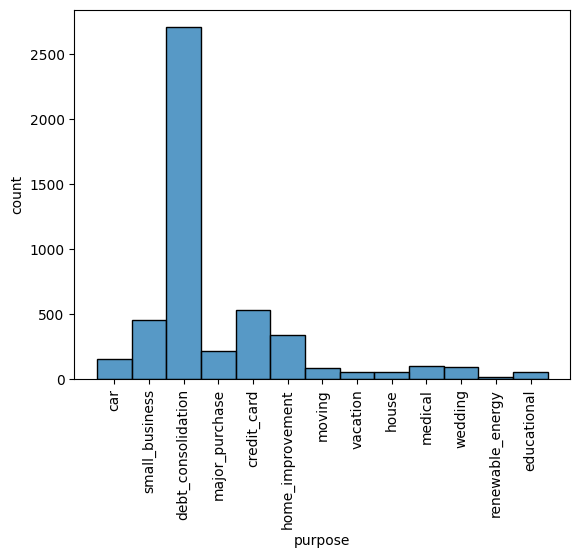

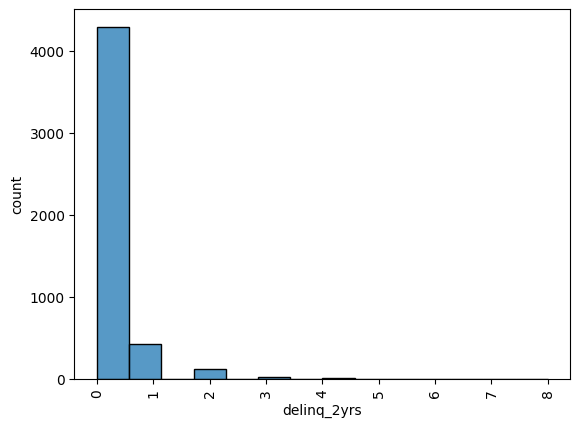

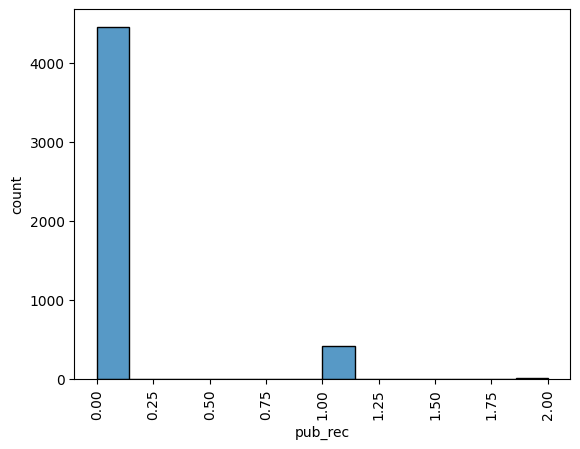

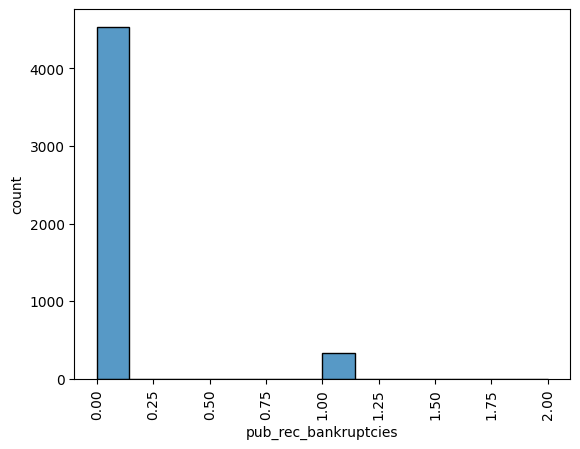

In [61]:
defaulters = loan_df[loan_df['loan_status']=='Charged Off']
for x in categorical:
    sns.histplot(data=defaulters, x=x)
    plt.xlabel(x)
    plt.xticks(rotation=90)
    plt.ylabel('count')
    plt.show()